In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/training-set/training_set.npz


In [ ]:
!pip install tensorflow==2.17.0
!pip install keras==3.4.1
!pip install tensorflow-decision-forests==1.10.0
!pip install tensorflow-text==2.17.0
!pip install tf-keras==2.17.0
!pip install keras-cv

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 601.3/601.3 MB 2.8 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 93.3 MB/s eta 0:00:00:00:01
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.16.2
    Uninstalling tensorboard-2.16.2:
      Successfully uninstalled tensorboard-2.16.2
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.16.1
    Uninstalling tensorflow-2.16.1:
      Successfully uninstalled tensorflow-2.16.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-decision-forests 1.9.1 requires tensorflow~=2.16.1, but you have tensorflow 2.17.0 which is incompatible.
tensorflow-text 2.16.1 requires tensorflow<2.17,>=2.16.1; platform_machine != "arm64" or platform_system != "Darwin", but you have tensorflow 2.17.0 which is incompatible.
tf-keras 2.16.0 

In [ ]:
import numpy as np
import os

import tensorflow as tf
#from tensorflow import keras as tfk
import keras as tfk
from keras.layers import Input, Dense, Dropout, Lambda
#from tensorflow.keras.layers import Input, Dense, Dropout, Lambda
from keras import layers as tfkl
import keras_cv

print(f"Tensorflow version -> {tf.__version__}")
print(f"Keras version -> {tfk.__version__}")

2024-11-23 10:44:28.623815: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-23 10:44:28.646186: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-23 10:44:28.652905: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Tensorflow version -> 2.17.0
Keras version -> 3.4.1


In [ ]:
# Set seed for reproducibility
seed = 42

# Import necessary libraries
import os
from time import sleep

# Import necessary modules
import logging
import random
import numpy as np

# Set seed for TensorFlow
tf.random.set_seed(seed)
tf.compat.v1.set_random_seed(seed)


# Import other libraries
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid1 import ImageGrid
import seaborn as sns
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score
import seaborn as sns
from PIL import Image

# Configure plot display settings
sns.set(font_scale=1.4)
sns.set_style('white')
plt.rc('font', size=14)
%matplotlib inline

## Load data

In [ ]:
# Load the training
npz = np.load('/kaggle/input/training-set/training_set.npz')

images = npz['images']
labels = npz['labels'].reshape((-1,))    # reshape y to get a one-dimensional array (num_samples,)

print("x shape: ", images.shape)
print("y shape: ", labels.shape)

x shape:  (13759, 96, 96, 3)
y shape:  (13759,)


## Inspect data

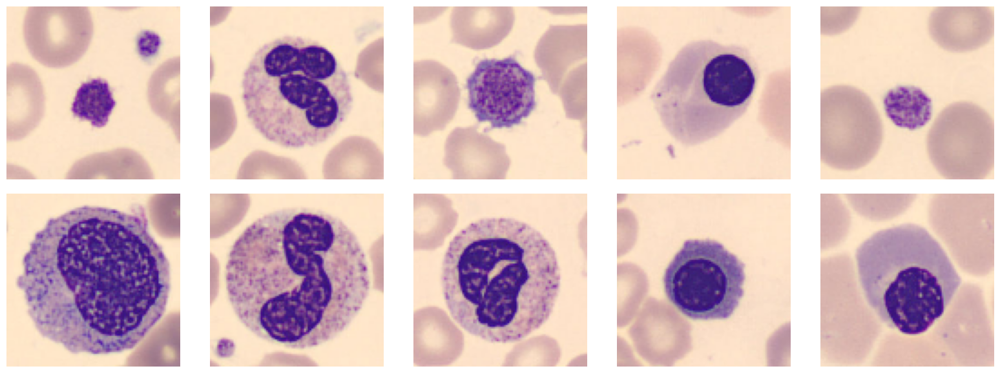

In [ ]:
# Number of images to display
num_img = 10

# Create subplots for displaying images
fig, axes = plt.subplots(2, num_img//2, figsize=(16, 6))
for i in range(num_img):
    ax = axes[i%2, i%num_img//2]
    ax.imshow(np.clip(images[i], 0, 255))  # Display clipped  images
    ax.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
images[11959] # shrek

array([[[158, 119, 102],
        [154, 113,  97],
        [153, 111,  96],
        ...,
        [171, 134, 109],
        [172, 134, 110],
        [171, 131, 107]],

       [[156, 117,  99],
        [155, 114,  97],
        [153, 111,  96],
        ...,
        [173, 135, 110],
        [172, 134, 109],
        [172, 133, 108]],

       [[154, 115,  98],
        [156, 115,  97],
        [154, 112,  96],
        ...,
        [174, 135, 111],
        [173, 134, 110],
        [169, 132, 107]],

       ...,

       [[137, 115, 101],
        [135, 115, 100],
        [134, 115, 100],
        ...,
        [147, 126, 113],
        [148, 127, 115],
        [146, 126, 114]],

       [[134, 114, 100],
        [134, 115, 101],
        [134, 115, 101],
        ...,
        [147, 126, 113],
        [149, 128, 115],
        [147, 127, 115]],

       [[135, 115, 103],
        [134, 115, 102],
        [135, 116, 103],
        ...,
        [145, 126, 115],
        [146, 130, 115],
        [148, 129, 114]]

In [ ]:
# Clean the dataset
images = images[:11958]
labels = labels[:11958]
print("clean x shape: ", images.shape)
print("clean y shape: ", labels.shape)

clean x shape:  (11958, 96, 96, 3)
clean y shape:  (11958,)


# Process data
#### The main idea is to enlarge the dataset by applying data augmentation using:
#### 1.  AugMix layer
#### 2. Rand augment layer


In [ ]:
def count_occurrences(x):
    """Conteggia quante immagini ci sono per ciascuna classe e le restituisce."""
    classes, classes_count = np.unique(x, return_counts=True)
    for i in range(len(classes)):
        print(f"{classes[i]}: {classes_count[i]} immagini")
    return classes, classes_count  # Aggiungi il return per restituire i valori

In [ ]:
count_occurrences(labels)

0: 852 immagini
1: 2181 immagini
2: 1085 immagini
3: 2026 immagini
4: 848 immagini
5: 993 immagini
6: 2330 immagini
7: 1643 immagini


(array([0, 1, 2, 3, 4, 5, 6, 7], dtype=uint8),
 array([ 852, 2181, 1085, 2026,  848,  993, 2330, 1643]))

In [ ]:
# In order to improve the final accuracy of the model, after being locally tested through a test-set obtained
# performing two splits on the dataset (see commented lines), we retrain the model on the whole dataset
'''
# Let's prepare training, validation and test sets
# First split into:
#   training + validation
#   test
x_train_val, x_test, y_train_val, y_test = train_test_split(
    images,
    labels,
    test_size = 0.10,
    random_state=seed,
    stratify=labels
)

# Second split into:
#   training
#   validation
x_train, x_val, y_train, y_val = train_test_split(
    x_train_val,
    y_train_val,
    test_size = len(x_test),
    random_state=seed,
    stratify=y_train_val
)
'''
x_train, x_val, y_train, y_val = train_test_split(
    images,
    labels,
    test_size = 0.10,
    random_state=seed,
    stratify=labels
)




print("x_train: ", x_train.shape)
print("x_val: ", x_val.shape)
#print("x_test: ", x_test.shape)

x_train:  (10762, 96, 96, 3)
x_val:  (1196, 96, 96, 3)


## Let's inspect class distribution of the training set

In [ ]:
count_occurrences(y_train)

0: 767 immagini
1: 1963 immagini
2: 976 immagini
3: 1823 immagini
4: 763 immagini
5: 894 immagini
6: 2097 immagini
7: 1479 immagini


(array([0, 1, 2, 3, 4, 5, 6, 7], dtype=uint8),
 array([ 767, 1963,  976, 1823,  763,  894, 2097, 1479]))

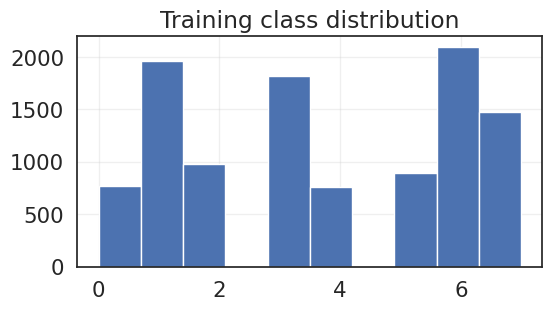

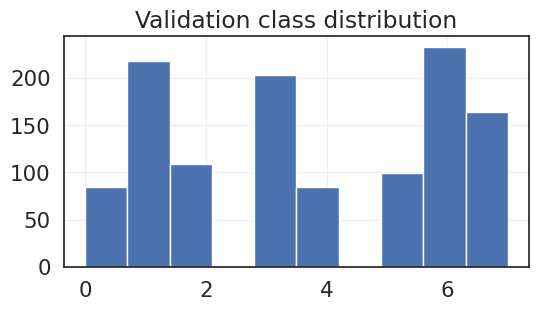

In [ ]:
# Inspect distribution of classes in the different sets
plt.figure(figsize=(6,3))
plt.hist(y_train)
plt.title('Training class distribution')
plt.grid(alpha=.3)

plt.figure(figsize=(6,3))
plt.hist(y_val)
plt.title('Validation class distribution')
plt.grid(alpha=.3)
'''
plt.figure(figsize=(6,3))
plt.hist(y_test)
plt.title('Test class distribution')
plt.grid(alpha=.3)
'''
plt.show()

In [ ]:
# Normalize images to the range [0, 1]
# we already know min (0) and max (255) because we are in RGB domain
x_train = (x_train / 255).astype('float32')
x_val = (x_val / 255).astype('float32')
#x_test = (x_test / 255).astype('float32')

# Convert labels to categorical format using one-hot encoding
y_train = tfk.utils.to_categorical(y_train)
y_val = tfk.utils.to_categorical(y_val)
#y_test = tfk.utils.to_categorical(y_test)

print("Hot encoded label: ", y_train[0])

Hot encoded label:  [0. 0. 0. 0. 0. 0. 1. 0.]


## Data augmentation pipeline
#### 1. Rand Augment to x random images from each class;
#### 2. Rand augment with low magnitude to the class 5 and 6 (monocytes and neutrophilis) that are the ones our models is struggling the most with;
#### 3. Aug mix to the unbalanced classes;

#### We will apply them in parallel to avoid applying rand augment to the aug mixed images or viceversa.

### Apply rand augment to only the class 5 and 6 (monocytes and neutrophilis) with a low magnitude: the main idea again is to gain more images of these 2 classes only but without altering them too much.

In [ ]:
# Applicare RandAugment a x immagini casuali della classe target
IMAGE_SIZE = (96, 96)

rand_augment = keras_cv.layers.RandAugment(value_range=[0, 1], magnitude=0.1, augmentations_per_image=1, geometric=False)

x_train = tf.image.resize(x_train, IMAGE_SIZE)
x_val = tf.image.resize(x_val, IMAGE_SIZE)

# Pipeline per applicare Rand augment
def pipeline_randaugment(images, labels):
    labels = tf.cast(labels, tf.float32)
    output_images = rand_augment(images)  # Applica rand augment alle immagini
    return output_images, labels

def apply_randaugment_to_class_5_6(images, labels, samples_per_class=200, target_class=5):
    label_indices = np.argmax(labels, axis=1)

    augmented_images = []
    augmented_labels = []

    # Seleziona solo le immagini della classe target
    class_mask = (label_indices == target_class)
    class_images = images[class_mask]
    class_labels = labels[class_mask]

    # Se la classe target ha immagini, applica rand augment
    if len(class_images) > 0:
        num_images = min(len(class_images), samples_per_class)
        selected_indices = tf.convert_to_tensor(np.random.choice(len(class_images), num_images, replace=False))

        selected_images = tf.gather(class_images, selected_indices)
        selected_labels = tf.gather(class_labels, selected_indices)

        # Applica Rand augment alle immagini selezionate della classe target
        aug_images, aug_labels = pipeline_randaugment(selected_images, selected_labels)

        augmented_images.append(aug_images)
        augmented_labels.append(aug_labels)

        # Aggiungere le immagini augmentate alla lista finale
    augmented_images = tf.concat(augmented_images, axis=0)
    augmented_labels = tf.concat(augmented_labels, axis=0)


    return augmented_images, augmented_labels




In [ ]:
# Applicare randAugm solo alla classe 5
x_train_randAugment_class5, y_train_randAugment_class5 = apply_randaugment_to_class_5_6(x_train, y_train, samples_per_class=300, target_class=5)

In [ ]:
# Applicare randAugm solo alla classe 6
x_train_randAugment_class6, y_train_randAugment_class6 = apply_randaugment_to_class_5_6(x_train, y_train, samples_per_class=300, target_class=6)

### Effect on class 5 (monocytes)

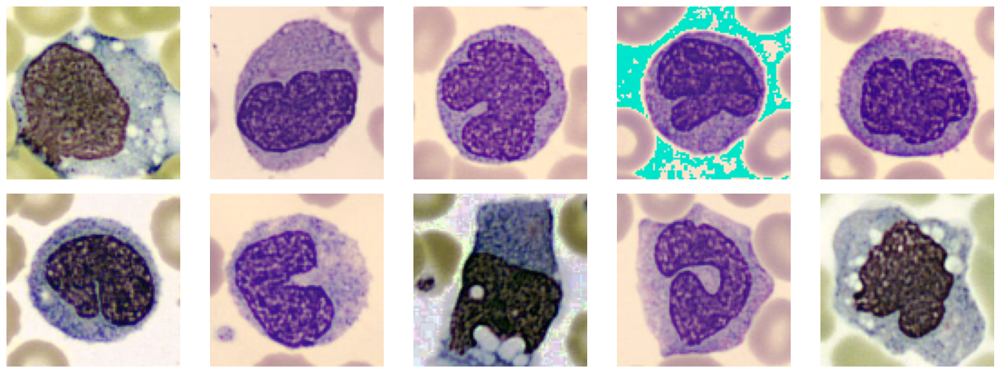

In [ ]:
# Number of images to display
num_img = 10

# Create subplots for displaying images
fig, axes = plt.subplots(2, num_img//2, figsize=(16, 6))
for i in range(num_img):
    ax = axes[i%2, i%num_img//2]
    ax.imshow(np.clip(x_train_randAugment_class5[i], 0, 255))  # Display rand augmented images
    ax.axis('off')
plt.tight_layout()
plt.show()

### Effect on class 6 (neutrophilis)

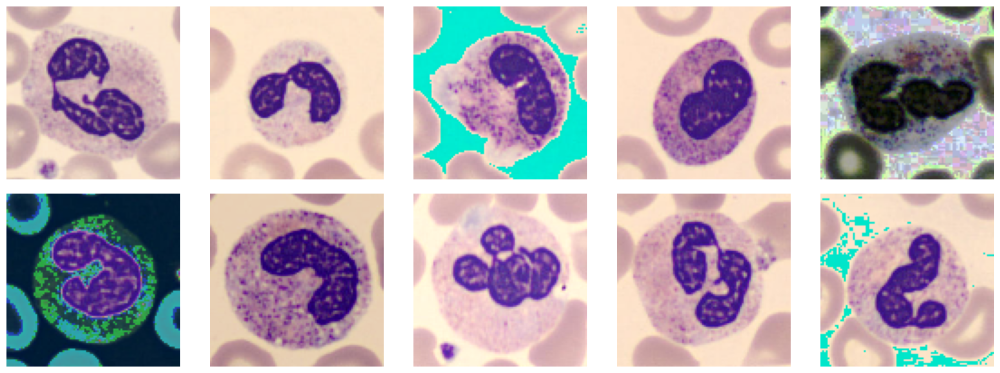

In [ ]:
# Number of images to display
num_img = 10

# Create subplots for displaying images
fig, axes = plt.subplots(2, num_img//2, figsize=(16, 6))
for i in range(num_img):
    ax = axes[i%2, i%num_img//2]
    ax.imshow(np.clip(x_train_randAugment_class6[i], 0, 255))  # Display rand augmented images
    ax.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
y_train_randAugment_class5_array = y_train_randAugment_class5.numpy()
classes, class_counts = count_occurrences(y_train_randAugment_class5_array.argmax(axis=1))

5: 300 immagini


### Apply rand augment to x samples of all classes

In [ ]:
# Applicare RandAugment a x immagini casuali per ciascuna classe
IMAGE_SIZE = (96, 96)

rand_augment = keras_cv.layers.RandAugment(value_range=[0, 1], augmentations_per_image=1, geometric=False)


x_train = tf.image.resize(x_train, IMAGE_SIZE)
x_val = tf.image.resize(x_val, IMAGE_SIZE)

# Pipeline per applicare RandAugment
def pipeline_randaugment(images, labels):

    labels = tf.cast(labels, tf.float32)
    output_images = rand_augment(images)  # Applica RandAugment  alle immagini
    return output_images, labels

def apply_randaugment_to_random_samples(images, labels, samples_per_class=500):
    # Convertire le etichette da one-hot a numeriche (usando .argmax(axis=1))
    label_indices = np.argmax(labels, axis=1)

    augmented_images = []
    augmented_labels = []

    # Iterare su ciascuna classe
    unique_classes = np.unique(label_indices)
    for cls in unique_classes:
        # Creare una maschera per selezionare le immagini della classe corrente
        class_mask = (label_indices == cls)
        class_images = images[class_mask]
        class_labels = labels[class_mask]

        # Selezionare casualmente fino a x immagini per questa classe
        num_images = min(len(class_images), samples_per_class)
        selected_indices = tf.convert_to_tensor(np.random.choice(len(class_images), num_images, replace=False))

        selected_images = tf.gather(class_images, selected_indices)
        selected_labels = tf.gather(class_labels, selected_indices)

        # Applicare RandAugment alle immagini selezionate
        aug_images, aug_labels = pipeline_randaugment(selected_images, selected_labels)

        # Aggiungere le immagini augmentate alla lista finale
        augmented_images.append(aug_images)
        augmented_labels.append(aug_labels)

    # Concatenare tutte le immagini e le etichette augmentate
    augmented_images = tf.concat(augmented_images, axis=0)
    augmented_labels = tf.concat(augmented_labels, axis=0)

    return augmented_images, augmented_labels

# Applicare RandAugment a x immagini casuali per ciascuna classe
x_train_randaugment, y_train_randaugment = apply_randaugment_to_random_samples(x_train, y_train, samples_per_class=500)


In [ ]:
x_train_randaugment.shape

TensorShape([4000, 96, 96, 3])

### Let's see rand augment effect

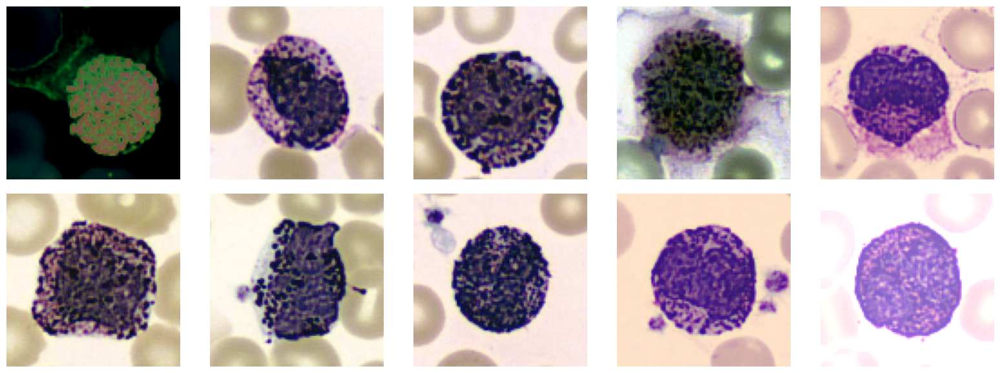

In [ ]:
# Number of images to display
num_img = 10

# Create subplots for displaying images
fig, axes = plt.subplots(2, num_img//2, figsize=(16, 6))
for i in range(num_img):
    ax = axes[i%2, i%num_img//2]
    ax.imshow(np.clip(x_train_randaugment[i], 0, 255))  # Display rand augmented images
    ax.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
# Identificare le classi sbilanciate
#classes, class_counts = count_occurrences(y_train.argmax(axis=1)) #usiamo .argmax per ottenere le etichette originali
#mean_class_count = np.mean(class_counts)
#imbalance_classes = classes #[class_counts < mean_class_count]
#imbalance_classes # These are the classes with fewer samples (below the mean)

0: 767 immagini
1: 1963 immagini
2: 976 immagini
3: 1823 immagini
4: 763 immagini
5: 894 immagini
6: 2097 immagini
7: 1479 immagini


array([0, 1, 2, 3, 4, 5, 6, 7])

In [ ]:
# Applicare Augmix solo alle classi sbilanciate
IMAGE_SIZE = (96, 96)

aug_mix = keras_cv.layers.AugMix([0, 1])

x_train = tf.image.resize(x_train, IMAGE_SIZE)
x_val = tf.image.resize(x_val, IMAGE_SIZE)

# Pipeline per applicare AugMix
def pipeline(images, labels):
    # Assicurati che labels siano in formato float32
    labels = tf.cast(labels, tf.float32)
    output = aug_mix({"images": images, "labels": labels})

    return output['images'], output['labels']

def apply_aug_mix_to_target_classes(images, labels, target_classes):
    # Convertire le etichette da one-hot a numeriche (usando .argmax(axis=1))
    label_indices = np.argmax(labels, axis=1)

    # Creare una maschera per selezionare solo le immagini delle classi selezionate
    target_mask = np.isin(label_indices, target_classes)

    # Filtrare le immagini e le etichette per le classi selezionate
    target_images = images[target_mask]
    target_labels = labels[target_mask]

    # Applicare AugMix solo alle immagini delle classi selezionate
    target_images, target_labels = pipeline(target_images, target_labels)

    return target_images, target_labels

#Applicare AugMix a tutte le classi
x_train_augmix, y_train_augmix = apply_aug_mix_to_target_classes(
    x_train, y_train, classes
)

### Show aug mix effect

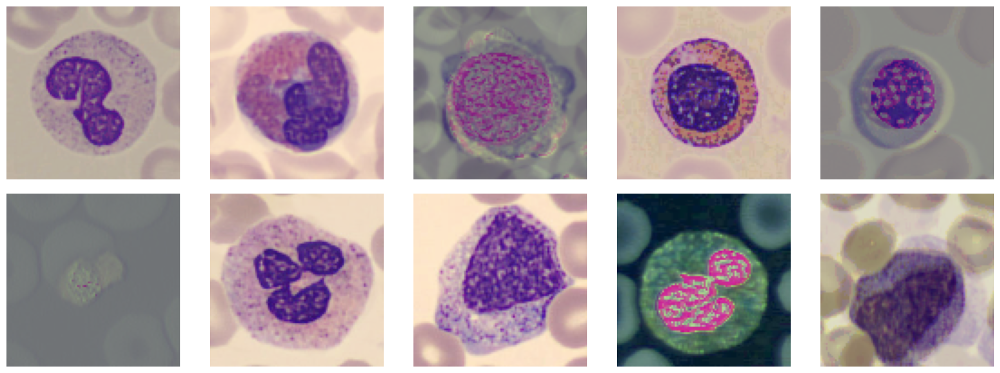

In [ ]:
# Number of images to display
num_img = 10

# Create subplots for displaying images
fig, axes = plt.subplots(2, num_img//2, figsize=(16, 6))
for i in range(num_img):
    ax = axes[i%2, i%num_img//2]
    ax.imshow(np.clip(x_train_augmix[i], 0, 255))  # Display cutmixed images
    ax.axis('off')
plt.tight_layout()
plt.show()

### Merge the images to the original dataset and define the class weights used to balance the dataset occurences

In [ ]:
# Concatenare le immagini originali con quelle modificate
x_train = tf.concat([x_train, x_train_augmix, x_train_randaugment, x_train_randAugment_class5, x_train_randAugment_class6], axis=0)
y_train = tf.concat([y_train, y_train_augmix, y_train_randaugment, y_train_randAugment_class5, y_train_randAugment_class6], axis=0)

In [ ]:
# data type stuff to transform the tensor obtained back to a numpy array
x_train = x_train.numpy()
y_train = y_train.numpy()

# As we can see the number of samples of the training set increases and it's better balanced as we can see in the next cell
x_train.shape

(26124, 96, 96, 3)

In [ ]:
# Check new classes samples
classes, classes_count = count_occurrences(y_train.argmax(axis=1))

0: 2034 immagini
1: 4426 immagini
2: 2452 immagini
3: 4146 immagini
4: 2026 immagini
5: 2588 immagini
6: 4994 immagini
7: 3458 immagini


### Show the renovated dataset

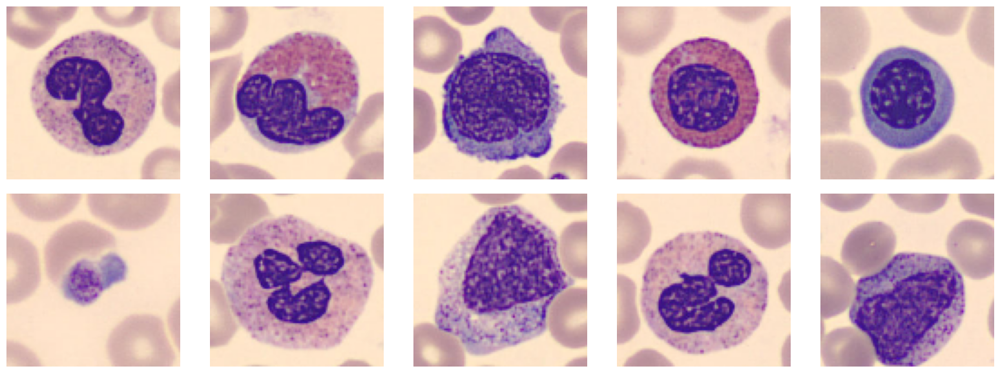

In [ ]:
# Number of images to display
num_img = 10

# Create subplots for displaying images
fig, axes = plt.subplots(2, num_img//2, figsize=(16, 6))
for i in range(num_img):
    ax = axes[i%2, i%num_img//2]
    ax.imshow(np.clip(x_train[i], 0, 255))  # first ten 'clean' images
    ax.axis('off')
plt.tight_layout()
plt.show()

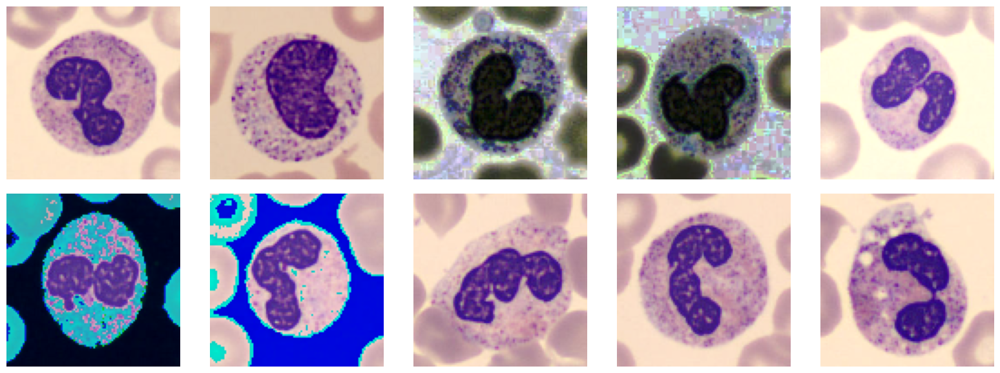

In [ ]:
# Number of images to display
num_img = 10

# Create subplots for displaying images
fig, axes = plt.subplots(2, num_img//2, figsize=(16, 6))
for i in range(num_img):
    ax = axes[i%2, i%num_img//2]
    ax.imshow(np.clip(x_train[-i], 0, 255))  # first ten 'augmented' images (notice the x_train[-i])
    ax.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
# Define class weights

total_samples = y_train.shape[0]
class_weights = {cls: total_samples / (8 * count) for cls, count in zip(classes, classes_count)}

print("class weights: ", class_weights)

class weights:  {0: 1.6054572271386431, 1: 0.7377993673746046, 2: 1.3317699836867862, 3: 0.7876266280752533, 4: 1.611796643632774, 5: 1.2617851622874807, 6: 0.6538846615939127, 7: 0.944331983805668}


# Define and build model

In [ ]:
# Define paramaeters of the network
input_shape = x_train.shape[1:]     # (96 x 96 x 3)
output_shape = y_train.shape[1]     # 8

print("Input shape:", input_shape)
print("Output shape:", output_shape)

epochs = 15
batch_size = 64

print("Epochs:", epochs)
print("Batch Size:", batch_size)

Input shape: (96, 96, 3)
Output shape: 8
Epochs: 15
Batch Size: 64
Learning Rate: 0.001


In [ ]:
# Early stopping
callbacks = tf.keras.callbacks.EarlyStopping(
    monitor='val_accuracy',
    min_delta=0,
    patience=5,
    verbose=0,
    mode='max',
    baseline=None,
    restore_best_weights=True,
    start_from_epoch=0
)

In [ ]:
# Apply data augmentation for training robustness
augmentation = tf.keras.Sequential([
    tfkl.RandomFlip("horizontal"),
    tfkl.RandomRotation(0.2),
    tfkl.RandomZoom(0.4),
    # tfkl.RandomBrightness(0.3, value_range=(0,1)), <- a quanto pare è terribile per l'accuracy
    tfkl.RandomContrast(0.6),
], name='Augmentation')

###  Transfer Learning

785596384/785596384 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


Model: "convnext_large"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 96, 96, 3) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_large_pre… │ (None, 96, 96, 3) │          0 │ input_layer[0][0] │
│ (Normalization)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_large_stem │ (None, 24, 24,    │      9,792 │ convnext_large_p… │
│ (Sequential)        │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│    └                │ (None, 24, 24,    │      9,408 │ -                 │
│ convnext_large_ste… │ 192)              │            │                   │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│    └                │ (None, 24, 24,    │        384 │ -                 │
│ convnext_large_ste… │ 192)              │            │                   │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_large_sta… │ (None, 24, 24,    │      9,600 │ convnext_large_s… │
│ (Conv2D)            │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_large_sta… │ (None, 24, 24,    │        384 │ convnext_large_s… │
│ (LayerNormalizatio… │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_large_sta… │ (None, 24, 24,    │    148,224 │ convnext_large_s… │
│ (Dense)             │ 768)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_large_sta… │ (None, 24, 24,    │          0 │ convnext_large_s… │
│ (Activation)        │ 768)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_large_sta… │ (None, 24, 24,    │    147,648 │ convnext_large_s… │
│ (Dense)             │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_large_sta… │ (None, 24, 24,    │        192 │ convnext_large_s… │
│ (LayerScale)        │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_large_sta… │ (None, 24, 24,    │          0 │ convnext_large_s… │
│ (Activation)        │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 24, 24,    │          0 │ convnext_large_s… │
│                     │ 192)              │            │ convnext_large_s… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_large_sta… │ (None, 24, 24,    │      9,600 │ add[0][0]         │
│ (Conv2D)            │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_large_sta… │ (None, 24, 24,    │        384 │ convnext_large_s… │
│ (LayerNormalizatio… │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_large_sta… │ (None, 24, 24,    │    148,224 │ convnext_large_s… │
│ (Dense)             │ 768)              │            │                 

 Total params: 196,230,336 (748.56 MB)

 Trainable params: 196,230,336 (748.56 MB)

 Non-trainable params: 0 (0.00 B)

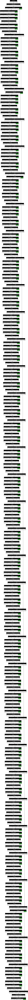

In [ ]:
# Initialise ConvextNetLarge model with pretrained weights, for transfer learning
convextNetLarge = tfk.applications.ConvNeXtLarge(
    input_shape=input_shape,
    include_preprocessing=True,
    include_top=False,
    weights='imagenet',
    pooling='avg',
)

# Display a summary of the model architecture
convextNetLarge.summary(expand_nested=True)

# Display model architecture with layer shapes and trainable parameters
tfk.utils.plot_model(convextNetLarge, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

In [ ]:
# Freeze all layers in ConvextNet to use it solely as a feature extractor
convextNetLarge.trainable = False

# Define input layer with shape matching the input images
inputs = tfk.Input(shape=input_shape, name='input_layer')

x = augmentation(inputs)

# Pass augmented inputs through the ConvextNet feature extractor
x = convextNetLarge(x, training=False)

# Add a dropout layer for regularisation
x = tfkl.Dropout(0.3, name='dropout')(x)

# Add final Dense layer for classification with softmax activation
x = tfkl.Dense(units=output_shape, name='dense')(x)
outputs = tfkl.Activation('softmax', name='softmax')(x)

# Define the complete model linking input and output
tl_model = tfk.Model(inputs=inputs, outputs=outputs, name='model')

# Compile the model with categorical cross-entropy loss and Adam optimiser
tl_model.compile(loss=tfk.losses.CategoricalCrossentropy(), optimizer=tfk.optimizers.Adam(), metrics=['accuracy'])

# Display a summary of the model architecture
#tl_model.summary(expand_nested=True)

# Display model architecture with layer shapes and trainable parameters
#tfk.utils.plot_model(tl_model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

In [ ]:
print(x_train.shape)

(26124, 96, 96, 3)


In [ ]:
# Train the model
tl_history = tl_model.fit(
    x=x_train * 255,
    y=y_train,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(x_val * 255, y_val),
    class_weight=class_weights,
    callbacks=[callbacks]
).history

# Calculate and print the best validation accuracy achieved
final_val_accuracy = round(max(tl_history['val_accuracy']) * 100, 2)
print(f'Final validation accuracy: {final_val_accuracy}%')

Epoch 1/15
409/409 ━━━━━━━━━━━━━━━━━━━━ 336s 821ms/step - accuracy: 0.8951 - loss: 0.3336 - val_accuracy: 0.9557 - val_loss: 0.1447
Epoch 2/15
409/409 ━━━━━━━━━━━━━━━━━━━━ 335s 820ms/step - accuracy: 0.8938 - loss: 0.3261 - val_accuracy: 0.9532 - val_loss: 0.1592
Epoch 3/15
409/409 ━━━━━━━━━━━━━━━━━━━━ 335s 820ms/step - accuracy: 0.8912 - loss: 0.3335 - val_accuracy: 0.9498 - val_loss: 0.1541
Epoch 4/15
409/409 ━━━━━━━━━━━━━━━━━━━━ 335s 820ms/step - accuracy: 0.8947 - loss: 0.3227 - val_accuracy: 0.9523 - val_loss: 0.1527
Epoch 5/15
409/409 ━━━━━━━━━━━━━━━━━━━━ 335s 820ms/step - accuracy: 0.8975 - loss: 0.3149 - val_accuracy: 0.9457 - val_loss: 0.1746
Final validation accuracy: 95.57%


In [ ]:
print(f'Final validation accuracy: {final_val_accuracy}%')

Final validation accuracy: 95.57%


### Fine Tuning

In [ ]:
# Unfreeze the base_model. Note that it keeps running in inference mode
# since we passed `training=False` when calling it. This means that
# the batchnorm layers will not update their batch statistics.
# This prevents the batchnorm layers from undoing all the training
# we've done so far.
convextNetLarge.trainable = True

# Set the number of layers to freeze
N = 141

# Set the first N layers as non-trainable
for i, layer in enumerate(tl_model.get_layer('convnext_large').layers[:N]):
    layer.trainable = False

tl_model.summary(show_trainable=True)

tl_model.compile(
    optimizer=tfk.optimizers.Adam(1e-5),  # Low learning rate
    loss=tfk.losses.CategoricalCrossentropy(),
    metrics=['accuracy']
)

epochs = 5
print("Fitting the end-to-end model")
tl_history = tl_model.fit(
    x=x_train * 255,
    y=y_train,
    batch_size=32,
    epochs=epochs,
    validation_data=(x_val * 255, y_val),
    class_weight=class_weights,
    callbacks=[callbacks]
).history

# Calculate and print the best validation accuracy achieved
final_val_accuracy = round(max(tl_history['val_accuracy']) * 100, 2)
print(f'Final validation accuracy: {final_val_accuracy}%')

Model: "model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)                ┃ Output Shape          ┃    Param # ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━┩
│ input_layer (InputLayer)    │ (None, 96, 96, 3)     │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ Augmentation (Sequential)   │ (None, 96, 96, 3)     │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ convnext_large (Functional) │ (None, 1536)          │ 196,230,3… │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dropout (Dropout)           │ (None, 1536)          │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dense (Dense)               │ (None, 8)             │     12,296 │   N   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ softmax (Activation)        │ (None, 8)             │          0 │   -   │
└─────────────────────────────┴───────────────────────┴────────────┴───────┘

 Total params: 196,242,632 (748.61 MB)

 Trainable params: 125,896,704 (480.26 MB)

 Non-trainable params: 70,345,928 (268.35 MB)

Fitting the end-to-end model
Epoch 1/5


W0000 00:00:1732368718.470550     130 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1732368718.493018     130 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1732368718.561051     130 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1732368718.577075     130 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1732368718.583401     130 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1732368718.589667     130 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1732368718.595931     130 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1732368718.607220     130 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1732368718.614262     130 gp

816/817 ━━━━━━━━━━━━━━━━━━━━ 0s 853ms/step - accuracy: 0.9133 - loss: 0.2731

W0000 00:00:1732369418.027934     131 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1732369418.029029     131 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1732369418.035506     131 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1732369418.038597     131 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1732369418.041280     131 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1732369418.043946     131 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1732369418.046603     131 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1732369418.047340     131 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1732369418.048134     131 gp

817/817 ━━━━━━━━━━━━━━━━━━━━ 753s 882ms/step - accuracy: 0.9133 - loss: 0.2730 - val_accuracy: 0.9682 - val_loss: 0.0982
Epoch 2/5
817/817 ━━━━━━━━━━━━━━━━━━━━ 711s 870ms/step - accuracy: 0.9381 - loss: 0.1835 - val_accuracy: 0.9716 - val_loss: 0.0892
Epoch 3/5
817/817 ━━━━━━━━━━━━━━━━━━━━ 711s 870ms/step - accuracy: 0.9483 - loss: 0.1543 - val_accuracy: 0.9774 - val_loss: 0.0730
Epoch 4/5
817/817 ━━━━━━━━━━━━━━━━━━━━ 710s 869ms/step - accuracy: 0.9530 - loss: 0.1308 - val_accuracy: 0.9749 - val_loss: 0.0750
Epoch 5/5
817/817 ━━━━━━━━━━━━━━━━━━━━ 710s 869ms/step - accuracy: 0.9588 - loss: 0.1157 - val_accuracy: 0.9783 - val_loss: 0.0638
Final validation accuracy: 97.83%


In [ ]:
# Save the trained model to a file with the accuracy included in the filename
model_filename = 'BLOOD_Augmented_CNN_'+str(final_val_accuracy)+'.keras'
tl_model.save(model_filename)

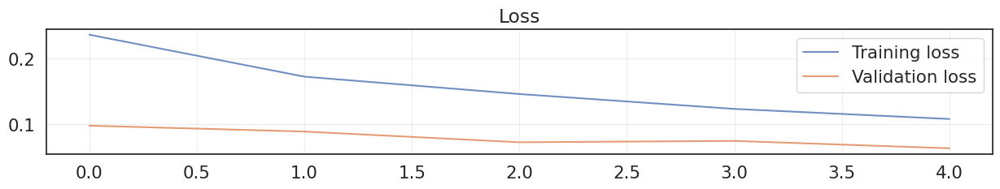

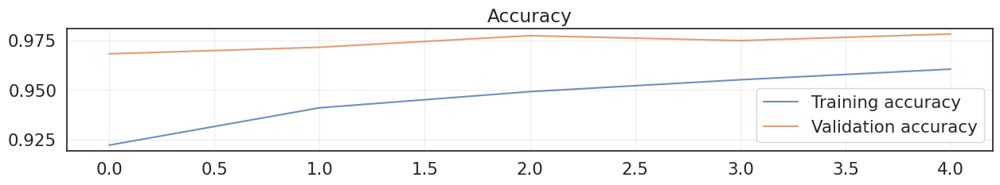

In [ ]:
# Plot training and validation loss
plt.figure(figsize=(15, 2))
plt.plot(tl_history['loss'], label='Training loss', alpha=.8)
plt.plot(tl_history['val_loss'], label='Validation loss', alpha=.8)
plt.title('Loss')
plt.legend()
plt.grid(alpha=.3)

# Plot training and validation accuracy
plt.figure(figsize=(15, 2))
plt.plot(tl_history['accuracy'], label='Training accuracy', alpha=.8)
plt.plot(tl_history['val_accuracy'], label='Validation accuracy', alpha=.8)
plt.title('Accuracy')
plt.legend()
plt.grid(alpha=.3)
plt.show()

In [ ]:
labels = ['Basophil', 'Eosinophil', 'Erythroblast', 'Immature granulocytes', 'Lymphocyte', 'Monocyte', 'Neutrophil', 'Platelet']

## Define and plot predictions on the test set through confusion matrix

In [ ]:
# left commented since we don't predcit anymore given that we only split the dataset into train-val
# for the final model in order to improve accuracy
'''
# Predict labels for the entire test set
predictions = tl_model.predict(x_test * 255, verbose=0)

# Convert predictions to class labels
pred_classes = np.argmax(predictions, axis=-1)

# Extract ground truth classes
true_classes = np.argmax(y_test, axis=-1)

cm = confusion_matrix(true_classes, pred_classes)

# Combine numbers and percentages into a single string for annotation
annot = np.array([f"{num}" for num in cm.flatten()]).reshape(cm.shape)

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm.T, annot=annot, fmt='', xticklabels=labels, yticklabels=labels, cmap='Blues')
plt.xlabel('True labels')
plt.ylabel('Predicted labels')
plt.show()
'''

'\n# Predict labels for the entire test set\npredictions = tl_model.predict(x_test * 255, verbose=0)\n\n# Convert predictions to class labels\npred_classes = np.argmax(predictions, axis=-1)\n\n# Extract ground truth classes\ntrue_classes = np.argmax(y_test, axis=-1)\n\ncm = confusion_matrix(true_classes, pred_classes)\n\n# Combine numbers and percentages into a single string for annotation\nannot = np.array([f"{num}" for num in cm.flatten()]).reshape(cm.shape)\n\n# Plot the confusion matrix\nplt.figure(figsize=(10, 8))\nsns.heatmap(cm.T, annot=annot, fmt=\'\', xticklabels=labels, yticklabels=labels, cmap=\'Blues\')\nplt.xlabel(\'True labels\')\nplt.ylabel(\'Predicted labels\')\nplt.show()\n'

In [ ]:
# Calculate and display test set accuracy
#accuracy = accuracy_score(true_classes, pred_classes)
#print(f'Accuracy score over the test set: {round(accuracy, 4)}')

# Test time augmentation

### The idea is to use, for each single prediction, the mean between several predictions made by the model on the image itself and on different augmented versions of it (test time augmentation).

# Prepare submission

In [ ]:
%%writefile model.py
import numpy as np
import cv2
import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl


class Model:
    def __init__(self):
        """
        Initialize the internal state of the model. Note that the __init__
        method cannot accept any arguments.

        The following is an example loading the weights of a pre-trained
        model.
        """
        self.neural_network = tfk.models.load_model('BLOOD_Augmented_CNN_97.83.keras')
        #self.neural_network_2 = tfk.models.load_model('EfficientNet_L.keras')

    def predict(self, X):

         # predictions
        yhat1 = self.predict_tta(self.neural_network, X)
        #yhat2 = self.predict_tta(self.neural_network_2, X)
        out = tf.argmax(yhat1, axis=-1)
        #out = tf.argmax((yhat1 + yhat2) / 2, axis=-1)

        return out

    '''
    Parametri della Rotazione nella riga: M = cv2.getRotationMatrix2D((cols / 2, rows / 2), angle, 1)
    Centro di rotazione: Il centro dell'immagine (cols / 2, rows / 2) --> l'immagine ruota attorno al suo centro.
    Angolo di rotazione (angle): Il valore del parametro angle definisce quaanto ruota: se > 0 -> senso antiorario
    Fattore di scala: Fissato a 1, mantiene le dimensioni dell'immagine inalterate.
    '''

    def rotate_image(self, image, angle):
        rows, cols, _ = image.shape
        M = cv2.getRotationMatrix2D((cols / 2, rows / 2), angle, 1)
        rotated_image = cv2.warpAffine(image, M, (cols, rows))
        return rotated_image

    def zoom_image(self, image, factor):
        rows, cols, _ = image.shape
        M = cv2.getRotationMatrix2D((cols / 2, rows / 2), 0, factor) # factor regola lo zoom
        zoomed_image = cv2.warpAffine(image, M, (cols, rows))
        return zoomed_image

    def augment_image(self, image):
        rotated_image = self.rotate_image(np.array(image), 20)       # rotazione di 20 gradi
        zoomed_image = self.zoom_image(np.array(image), 1.4)         # zoom del 40%
        contrast_image = self.contrast_image(np.array(image), 1.8)   # contrasto 80%
        return image, rotated_image,zoomed_image

    # It shoud return predictions like model.predic:  [prob Class1, probClass2]
    def predict_tta(self, model, images):
        predictions_aggregate = []
        for img in images:
            aug_images = np.array(self.augment_image(img))
            predictions = model.predict(aug_images, verbose=0)
            pred_agg = np.mean(predictions, axis=0)

            predictions_aggregate.append(pred_agg)
        return tf.convert_to_tensor(np.array(predictions_aggregate))


Writing model.py


In [ ]:
from datetime import datetime
filename = f'submission_{datetime.now().strftime("%y%m%d_%H%M%S")}.zip'

# Add files to the zip command if needed
!zip {filename} model.py BLOOD_Augmented_CNN_97.83.keras

#from google.colab import files
#files.download(filename)

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


  adding: model.py (deflated 63%)
  adding: BLOOD_Augmented_CNN_97.83.keras (deflated 7%)
